# AI61201: Visual Computing with AI/ML (Autumn 2026)
### **Programming Assignment 1:** Working With Images Using OpenCV (20 Marks)

**Instructions:** Complete all the tasks given, keeping the following points in mind:
- Implement the image operations from scratch (without using the OpenCV library) and verify using OpenCV library functions.
- Vectorized implementations are possible for most operations, and using for or while loops to access individual pixels is strongly discouraged due to its inefficiency. You can use NumPy to perform the mathematical operations.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Task 1: Loading and retrieving RGB channels of an image (1 Mark)

- Load `iMAGEa.jpg` (Assignment-1 resources) using OpenCV and display it in the RGB space.
- Display its individual color channels (R, G, B) with proper labels.

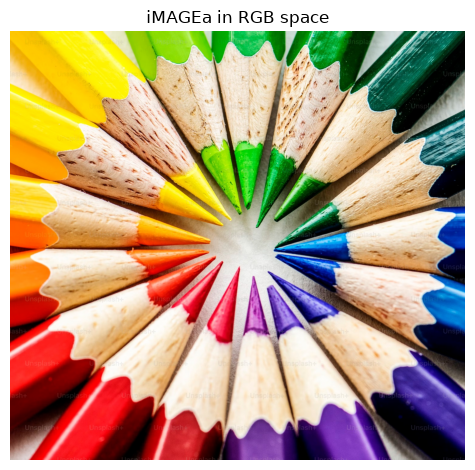

In [2]:
# Load the image
img = cv2.imread("resources/iMAGEa.jpg")    

# Open CV loads the image in BGR space
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # convert from BGR to RGB space

# use matplotlib for showing output within the notebook
plt.imshow(img_rgb)                             
plt.title("iMAGEa in RGB space")
plt.axis("off")
plt.tight_layout()

In [3]:
# utility method to plot multiple images / channels in a layout
def display_images(rows, cols, channels, channel_names, title):
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axes = np.array(axes).flatten()
    fig.suptitle(title, fontsize=20)
    
    for i in range(len(channels)):
        if channels[i].ndim == 3 and channels[i].shape[2] == 3:
            axes[i].imshow(channels[i])                 # plot image in color
        else:
            axes[i].imshow(channels[i], cmap='gray')    # plot single channel in grayscale
        axes[i].set_title(channel_names[i])
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

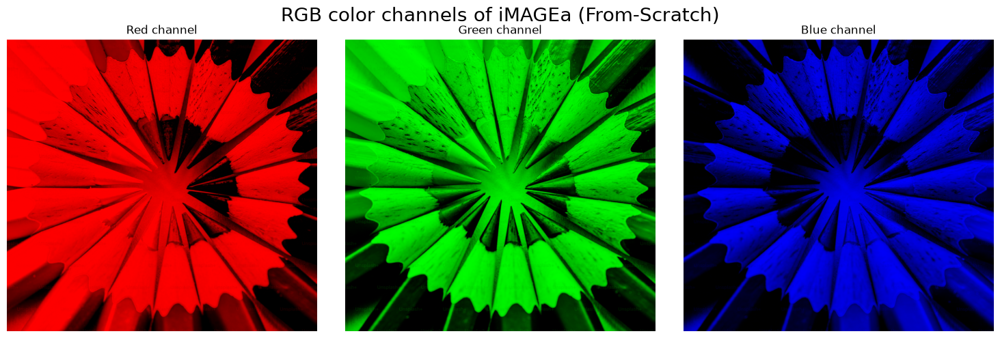

In [4]:
# FROM-SCRATCH IMPLEMENTATION
# Extract individual color channels
red_channel = img[:, :, 2]
green_channel = img[:, :, 1]
blue_channel = img[:, :, 0]

# create a blank channel
zero_channel = np.zeros_like(red_channel)

# merge each color channel with other channels as blank to see the color
red_img = np.stack([red_channel, zero_channel, zero_channel], axis=2)
green_img = np.stack([zero_channel, green_channel, zero_channel], axis=2)
blue_img = np.stack([zero_channel, zero_channel, blue_channel], axis=2)

# plot the color components in a row
display_images(
    rows=1, cols=3, 
    channels=[red_img, green_img, blue_img], 
    channel_names=['Red channel', 'Green channel', 'Blue channel'], 
    title='RGB color channels of iMAGEa (From-Scratch)'
)

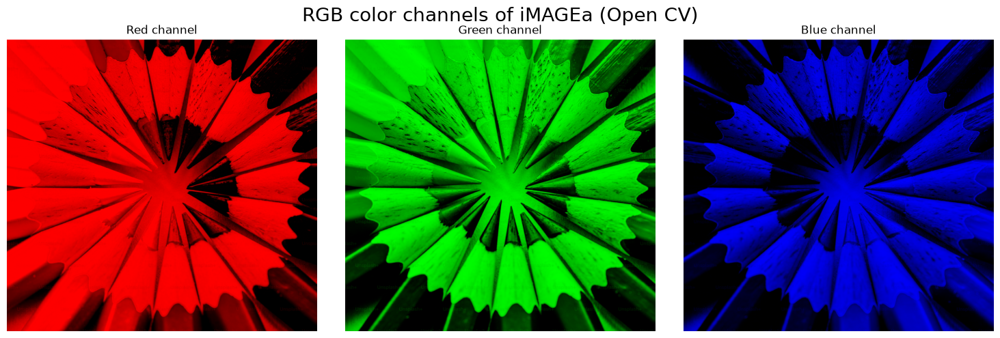

In [5]:
# OPEN CV IMPLEMENTATION
# Extract individual color channels
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # convert from BGR to RGB space
red_channel, green_channel, blue_channel = cv2.split(img)

# create a blank channel
zero_channel = np.zeros_like(red_channel)

# merge each color channel with other channels as blank to see the color
red_img = cv2.merge([red_channel, zero_channel, zero_channel])
green_img = cv2.merge([zero_channel, green_channel, zero_channel])
blue_img = cv2.merge([zero_channel, zero_channel, blue_channel])

# plot the color components in a row
display_images(
    rows=1, cols=3, 
    channels=[red_img, green_img, blue_img], 
    channel_names=['Red channel', 'Green channel', 'Blue channel'], 
    title='RGB color channels of iMAGEa (Open CV)'
)

## Task 2: Color Space Conversion (6 Marks)

### Task 2.1: YCbCr Operations (3 Marks)
- Convert the `iMAGEa.jpg` into the YCbCr color space, and display the Y, Cb, and Cr channels individually.
- Increase the `brightness` of the image by a constant value using the YCbCr image (Note: clip brightness levels to the range of [0, 255]).
- Convert the image back to RGB and display it. Compare your results with those obtained by using OpenCV functions.

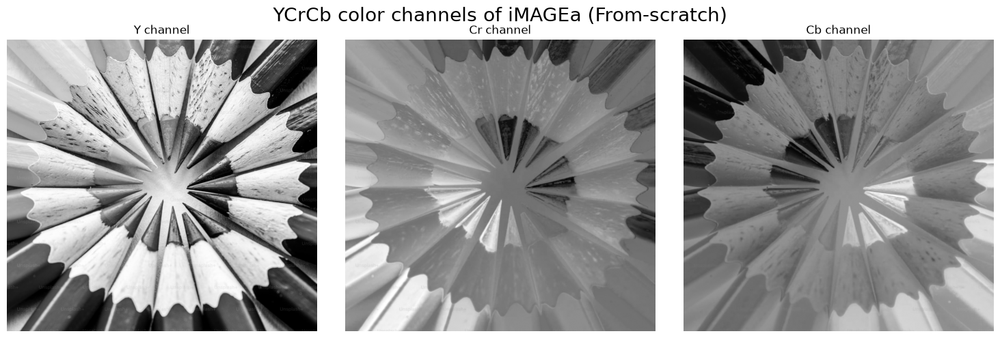

In [6]:
# FROM SCRATCH IMPLEMENTATION (1/3)
# Convert RGB into YCbCr space
# we'll follow YCrCb order to compare with the Open CV implementation
y_channel = 0.299 * red_channel + 0.587 * green_channel + 0.114 * blue_channel
cr_channel = 0.713 * (red_channel - y_channel) + 128
cb_channel = 0.564 * (blue_channel - y_channel) + 128

# clip all channel values within [0, 255]
y_channel = np.clip(y_channel, 0, 255)
cr_channel = np.clip(cr_channel, 0, 255)
cb_channel = np.clip(cb_channel, 0, 255)

# form the image by stacking all channels
ycrcb_img = np.stack([y_channel, cr_channel, cb_channel], axis=2).astype(np.uint8)

# plot the color channels 
display_images(
    rows=1, cols=3, 
    channels=[y_channel, cr_channel, cb_channel], 
    channel_names=['Y channel', 'Cr channel', 'Cb channel'], 
    title='YCrCb color channels of iMAGEa (From-scratch)'
)

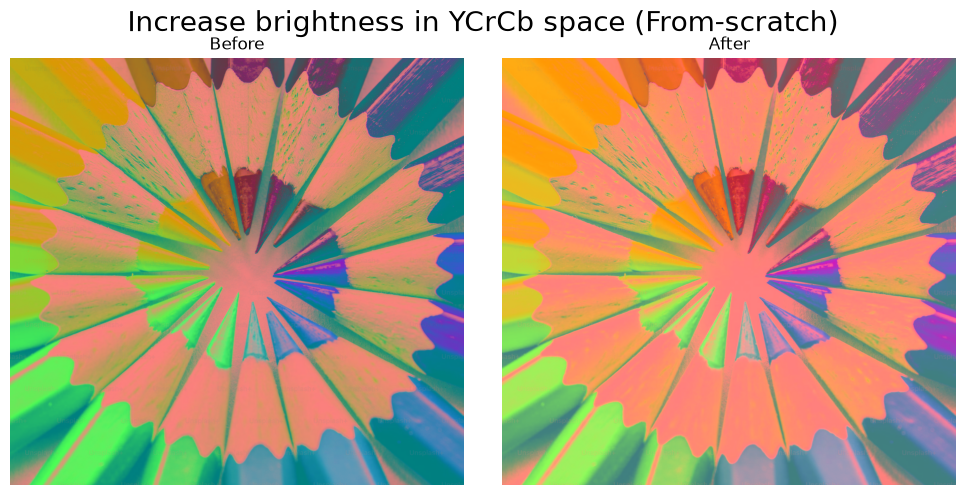

In [7]:
# FROM SCRATCH IMPLEMENTATION (2/3)
# Increase brightness by a constant value using YCrCb image
brightness = 64
y_channel_new = np.clip(y_channel + brightness, 0, 255)
ycrcb_img_new = np.stack([y_channel_new, cr_channel, cb_channel], axis=2).astype(np.uint8)

# show before and after in YCrCb space
display_images(
    rows=1, cols=2,
    channels=[ycrcb_img, ycrcb_img_new],
    channel_names=['Before', 'After'],
    title='Increase brightness in YCrCb space (From-scratch)'
)

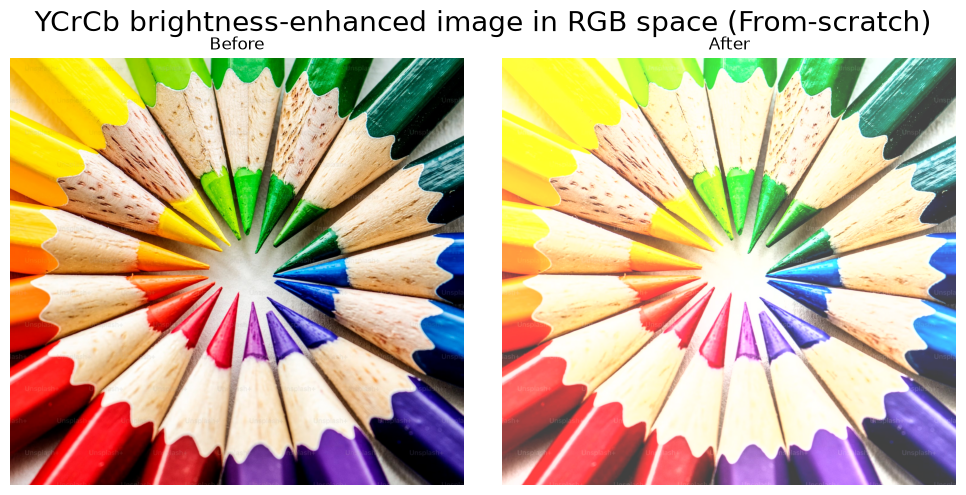

In [8]:
# FROM SCRATCH IMPLEMENTATION (3/3)
# Convert the resultant YCrCb image back into RGB space
red_channel_new = (cr_channel - 128) / 0.713 + y_channel_new
blue_channel_new = (cb_channel - 128) / 0.564 + y_channel_new
green_channel_new = (y_channel_new - 0.299 * red_channel_new - 0.114 * blue_channel_new) / 0.587

# clip all channel values within [0, 255]
red_channel_new = np.clip(red_channel_new, 0, 255)
green_channel_new = np.clip(green_channel_new, 0, 255)
blue_channel_new = np.clip(blue_channel_new, 0, 255)

# reconstruct the image
img_new = np.stack([red_channel_new, green_channel_new, blue_channel_new], axis=2).astype(np.uint8)

# show before and after in RGB space
display_images(
    rows=1, cols=2,
    channels=[img, img_new],
    channel_names=['Before', 'After'],
    title='YCrCb brightness-enhanced image in RGB space (From-scratch)'
)

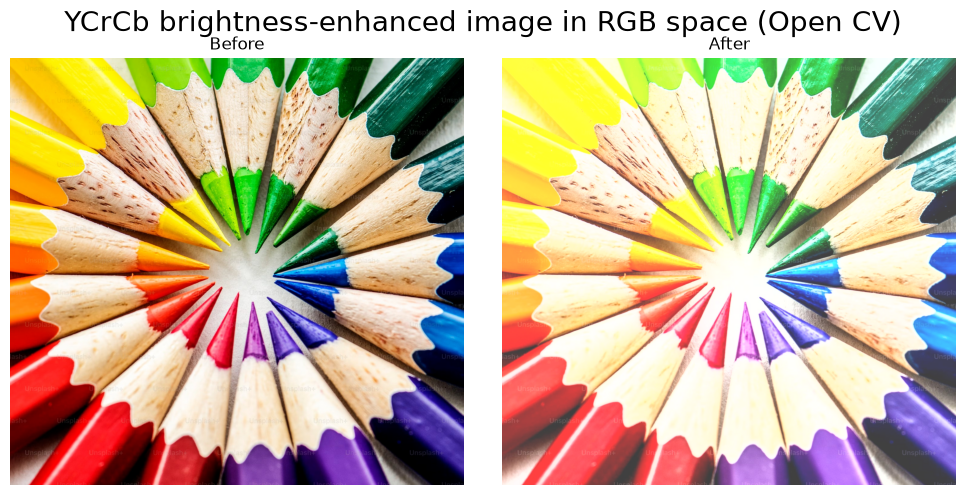

In [9]:
# OPEN CV IMPLEMENTATION
# Increasing brightness using YCrCb image
ycrcb_img_cv = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)

# extract channels
y_channel_cv, cr_channel_cv, cb_channel_cv = cv2.split(ycrcb_img_cv)

# increase brightness in Y channel
y_channel_cv_new = cv2.add(y_channel_cv, brightness)

# reconstruct the new YCbCr image
ycrcb_img_cv_new = cv2.merge([y_channel_cv_new, cr_channel_cv, cb_channel_cv])

# convert resultant YCbCr image back into RGB space
img_cv_new = cv2.cvtColor(ycrcb_img_cv_new, cv2.COLOR_YCrCb2RGB)

# show before and after in RGB space
display_images(
    rows=1, cols=2,
    channels=[img, img_cv_new],
    channel_names=['Before', 'After'],
    title='YCrCb brightness-enhanced image in RGB space (Open CV)'
)

In [10]:
# COMPARSION
errors = np.abs(img_new.astype(np.int16) - img_cv_new.astype(np.int16))
print("YCbCr Brightened Image Comparison")
print("Mean Absolute Error: ", np.mean(errors))
print("Max. Absolute Error: ", np.max(errors))

YCbCr Brightened Image Comparison
Mean Absolute Error:  0.2352419586735355
Max. Absolute Error:  2


### Task 2.2: HSV Operations (3 Marks)
- Convert the `iMAGEa.jpg` to HSV color space.
- Increase the `saturation` of all colors to the maximum values.
- Convert back to the RGB color space and show the result. Compare your results with those obtained by using OpenCV functions.

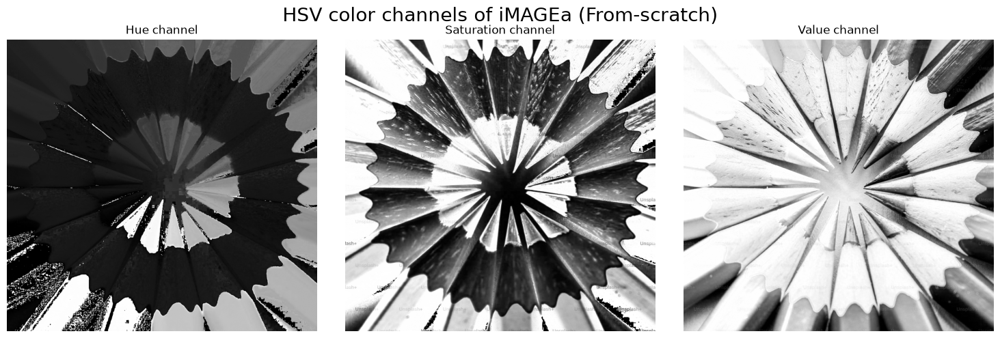

In [11]:
# FROM SCRATCH IMPLEMENTATION (1/3)
# Convert RGB into HSV

# normalize RGB values
red_normalized = red_channel / 255
green_normalized = green_channel / 255
blue_normalized = blue_channel / 255

# store RGB pixel-wise stats
min_rgb = np.min([red_normalized, green_normalized, blue_normalized], axis=0)
max_rgb = np.max([red_normalized, green_normalized, blue_normalized], axis=0)
del_rgb = max_rgb - min_rgb

# calculate individual channels
value_channel = max_rgb

saturation_channel = np.zeros_like(value_channel)
is_non_zero = (value_channel > 0)
saturation_channel[is_non_zero] = del_rgb[is_non_zero] / value_channel[is_non_zero]

hue_channel = np.zeros_like(value_channel)
is_del_non_zero = (del_rgb != 0)

# where max. value is red
is_red_max = (value_channel == red_normalized) & is_del_non_zero
hue_channel[is_red_max] = (green_normalized[is_red_max] - blue_normalized[is_red_max]) / del_rgb[is_red_max]

# where max. value is green
is_green_max = (value_channel == green_normalized) & is_del_non_zero
hue_channel[is_green_max] = 2 + (blue_normalized[is_green_max] - red_normalized[is_green_max]) / del_rgb[is_green_max]

# where max. value is blue
is_blue_max = (value_channel == blue_normalized) & is_del_non_zero
hue_channel[is_blue_max] = 4 + (red_normalized[is_blue_max] - green_normalized[is_blue_max]) / del_rgb[is_blue_max]

hue_channel *= 60
hue_channel[hue_channel < 0] += 360   # handle negatives

# form the image by stacking all channels
# scaling & clipping done to compare with Open CV implementation
hsv_img = np.stack([
    np.clip(hue_channel / 2, 0, 179),
    np.clip(saturation_channel * 255, 0, 255),
    np.clip(value_channel * 255, 0, 255)
], axis=2).astype(np.uint8)

# plot the color channels along with the resultant image
display_images(
    rows=1, cols=3, 
    channels=[hue_channel, saturation_channel, value_channel], 
    channel_names=['Hue channel', 'Saturation channel', 'Value channel'], 
    title='HSV color channels of iMAGEa (From-scratch)'
)

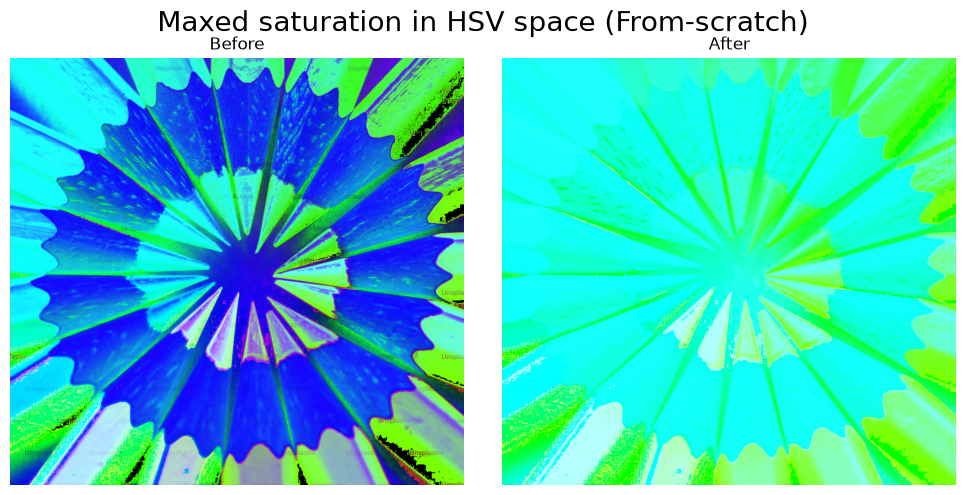

In [12]:
# FROM SCRATCH IMPLEMENTATION (2/3)
# Increase the saturation of all colors to max.
saturation_channel_new = np.ones_like(saturation_channel)

# form the image by stacking all channels
# scaling & clipping done to compare with Open CV implementation
hsv_img_new = np.stack([
    np.clip(hue_channel / 2, 0, 179),
    np.clip(saturation_channel_new * 255, 0, 255),
    np.clip(value_channel * 255, 0, 255)
], axis=2).astype(np.uint8)

# show before and after in HSV space
display_images(
    rows=1, cols=2,
    channels=[hsv_img, hsv_img_new],
    channel_names=['Before', 'After'],
    title='Maxed saturation in HSV space (From-scratch)'
)

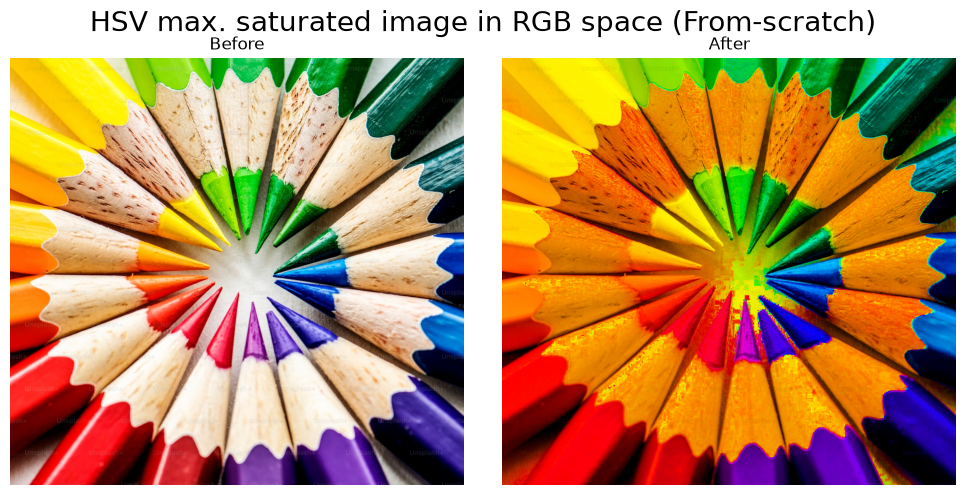

In [13]:
# FROM SCRATCH IMPLEMENTATION (3/3)
# Convert HSV back into RGB color space
"""
    C = VS
    H' = H / 60
    X = C * (1 - |H mod 2 - 1|)

    If 0 ≤ H' < 1: (R, G, B) = (C, X, 0)
    If 1 ≤ H' < 2: (R, G, B) = (X, C, 0)
    If 2 ≤ H' < 3: (R, G, B) = (0, C, X)
    If 3 ≤ H' < 4: (R, G, B) = (0, X, C)
    If 4 ≤ H' < 5: (R, G, B) = (X, 0, C)
    If 5 ≤ H' < 6: (R, G, B) = (C, 0, X)

    m = V - C
    (R, G, B) = (R + m, G + m, B + m)
"""

chroma = value_channel * saturation_channel_new
hue_sector = hue_channel / 60
x = chroma * (1 - np.abs((hue_sector % 2) - 1))

red_channel_new = np.zeros_like(hue_channel)
green_channel_new = np.zeros_like(hue_channel)
blue_channel_new = np.zeros_like(hue_channel)

mask = (hue_sector >= 0) & (hue_sector < 1)
red_channel_new[mask] = chroma[mask]
green_channel_new[mask] = x[mask]

mask = (hue_sector >= 1) & (hue_sector < 2)
red_channel_new[mask] = x[mask]
green_channel_new[mask] = chroma[mask]

mask = (hue_sector >= 2) & (hue_sector < 3)
green_channel_new[mask] = chroma[mask]
blue_channel_new[mask] = x[mask]

mask = (hue_sector >= 3) & (hue_sector < 4)
green_channel_new[mask] = x[mask]
blue_channel_new[mask] = chroma[mask]

mask = (hue_sector >= 4) & (hue_sector < 5)
red_channel_new[mask] = x[mask]
blue_channel_new[mask] = chroma[mask]

mask = (hue_sector >= 5) & (hue_sector < 6)
red_channel_new[mask] = chroma[mask]
blue_channel_new[mask] = x[mask]

match_value = value_channel - chroma
red_channel_new += match_value
blue_channel_new += match_value
green_channel_new += match_value

# scale up from [0, 1] to [0, 255] and clip
red_channel_new = np.clip(red_channel_new * 255, 0, 255)
green_channel_new = np.clip(green_channel_new * 255, 0, 255)
blue_channel_new = np.clip(blue_channel_new * 255, 0, 255)

# reconstruct the image
img_new = np.stack([red_channel_new, green_channel_new, blue_channel_new], axis=2).astype(np.uint8)

# show before and after in RGB space
display_images(
    rows=1, cols=2,
    channels=[img, img_new],
    channel_names=['Before', 'After'],
    title='HSV max. saturated image in RGB space (From-scratch)'
)

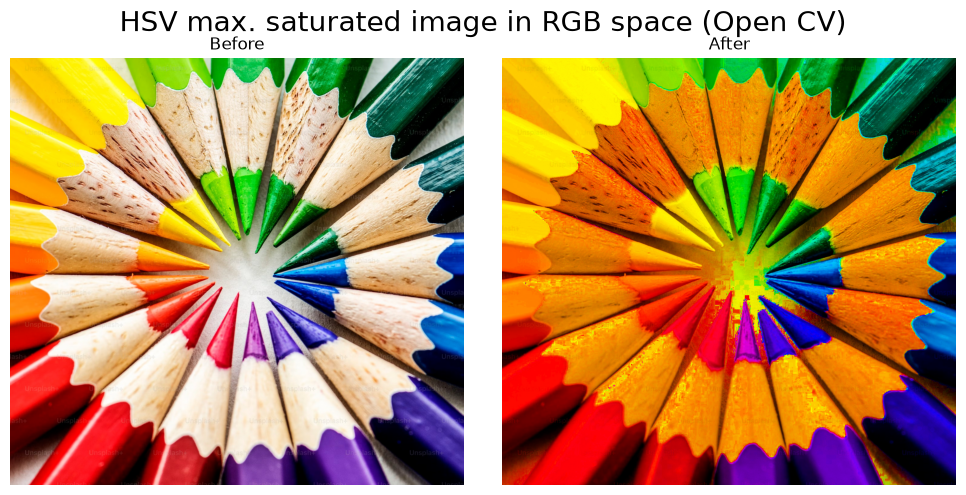

In [14]:
# OPEN CV IMPLEMENTATION
# Set saturation to max. using HSV image
hsv_img_cv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

# extract channels
hue_channel_cv, saturation_channel_cv, value_channel_cv = cv2.split(hsv_img_cv)

# create max saturation channel
saturation_channel_cv_new = np.full_like(saturation_channel_cv, 255)

# reconstruct the new HSV image
hsv_img_cv_new = cv2.merge([hue_channel_cv, saturation_channel_cv_new, value_channel_cv])

# convert resultant HSV image back into RGB space
img_cv_new = cv2.cvtColor(hsv_img_cv_new, cv2.COLOR_HSV2RGB)

# show before and after in RGB space
display_images(
    rows=1, cols=2,
    channels=[img, img_cv_new],
    channel_names=['Before', 'After'],
    title='HSV max. saturated image in RGB space (Open CV)'
)

In [15]:
# COMPARSION
errors = np.abs(img_new.astype(np.int16) - img_cv_new.astype(np.int16))
print("HSV Saturated Image Comparison")
print("Mean Absolute Error: ", np.mean(errors))
print("Max. Absolute Error: ", np.max(errors))

HSV Saturated Image Comparison
Mean Absolute Error:  0.5083357970991015
Max. Absolute Error:  5


## Task 3: Bit Plane Operations (4 Marks)
- Load `iMAGEb.jpg` ( Assignment-1 resources ). Convert the image to greyscale and toggle alternate bit planes of the image, i.e., keep bit planes 8, 6, 4, and 2 as they are and toggle bit planes 7, 5, 3, and 1.
- Display the greyscale image with toggled bit planes.

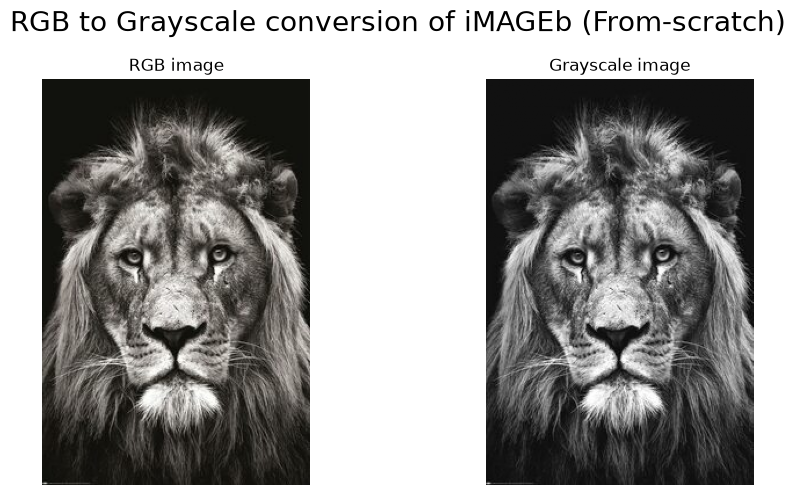

In [16]:
# FROM-SCRATCH IMPLEMENTATION (1/2)
# Convert RGB into grayscale image
img = cv2.imread("resources/iMAGEb.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# convert using the expression for luminance channel in YCrCb
img_grayscale = np.clip(
    0.299 * img[:, :, 0] + 0.587 * img[:, :, 1] + 0.114 * img[:, :, 2],
    0, 255).astype(np.uint8)

# show the conversion
display_images(
    rows=1, cols=2,
    channels=[img, img_grayscale],
    channel_names=['RGB image', 'Grayscale image'],
    title='RGB to Grayscale conversion of iMAGEb (From-scratch)'
)

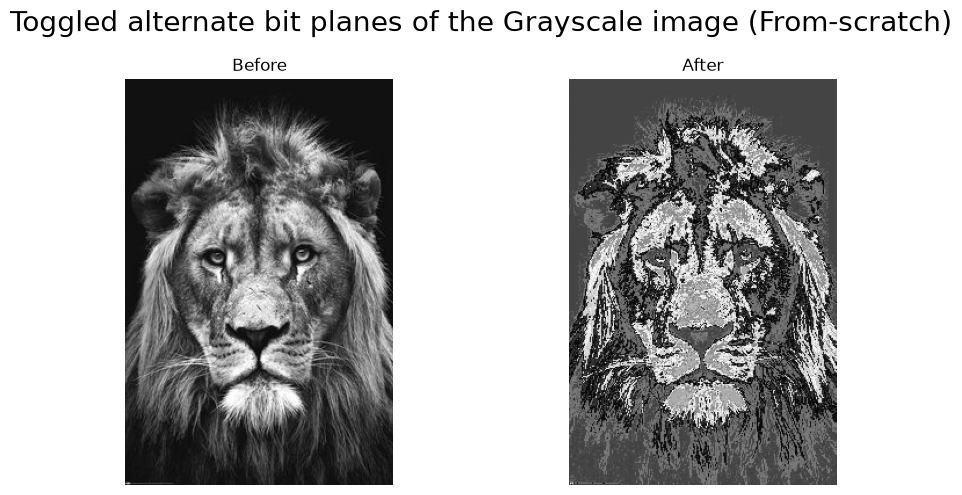

In [17]:
# FROM-SCRATCH IMPLEMENTATION (2/2)
# Toggle bit planes 7, 5, 3, 1 of the grayscale image
# Corresponding bit plane indices -> (6, 4, 2, 0)
# Required toggle_mask = 01010101
toggle_mask = ((1 << 6) | (1 << 4) | (1 << 2) | (1 << 0))

# x ^ 0 = x and x ^ 0 = x'
img_toggled = img_grayscale ^ toggle_mask

# show before and after
display_images(
    rows=1, cols=2,
    channels=[img_grayscale, img_toggled],
    channel_names=['Before', 'After'],
    title='Toggled alternate bit planes of the Grayscale image (From-scratch)'
)

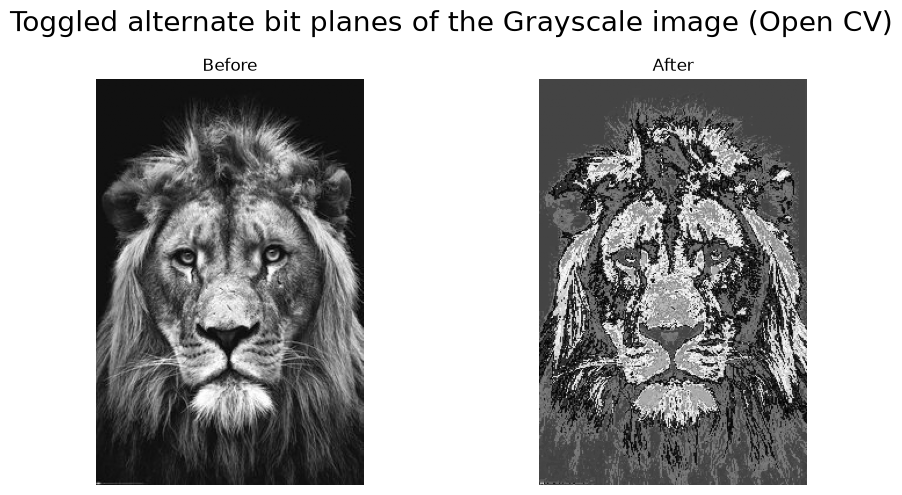

In [18]:
# OPEN CV IMPLEMENTATION 
# Convert to grayscale image & toggle bit planes 7, 5, 3, 1
img_grayscale_cv = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# create an image-sized mask using previous mask
full_mask = np.full_like(img_grayscale_cv, toggle_mask)

# x ^ 0 = x and x ^ 0 = x'
img_toggled_cv = cv2.bitwise_xor(img_grayscale_cv, full_mask)

# show before and after
display_images(
    rows=1, cols=2,
    channels=[img_grayscale_cv, img_toggled_cv],
    channel_names=['Before', 'After'],
    title='Toggled alternate bit planes of the Grayscale image (Open CV)'
)

In [19]:
# COMPARSION
errors_grayscale = np.abs(img_grayscale.astype(np.int16) - img_grayscale_cv.astype(np.int16))
errors_toggled = np.abs(img_toggled.astype(np.int16) - img_toggled_cv.astype(np.int16))
print("Grayscale image comparison")
print("Mean Absolute Error: ", np.mean(errors_grayscale))
print("Max. Absolute Error: ", np.max(errors_grayscale))
print("Bitplane-toggled image comparison")
print("Mean Absolute Error: ", np.mean(errors_toggled))
print("Max. Absolute Error: ", np.max(errors_toggled))

Grayscale image comparison
Mean Absolute Error:  0.2976747062461348
Max. Absolute Error:  1
Bitplane-toggled image comparison
Mean Absolute Error:  1.555930735930736
Max. Absolute Error:  171


## Task 4: Spatial Transformations and Interpolation (9 Marks)
Load `iMAGEc.jpg` ( Assignment-1 resources ).

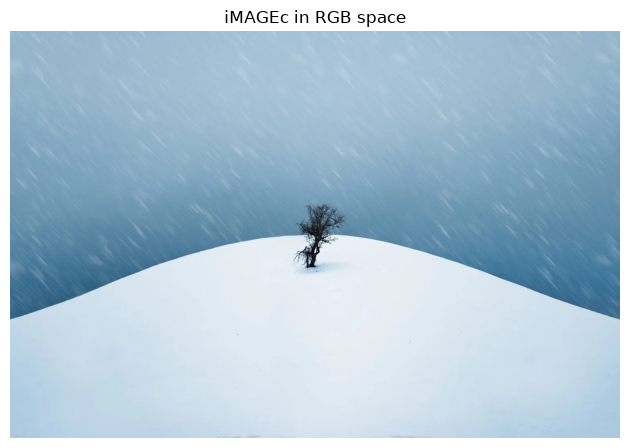

In [20]:
# Load the image
img = cv2.imread("resources/iMAGEc.jpg")

# convert from BGR to RGB space
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  

# display RGB
plt.imshow(img)
plt.title('iMAGEc in RGB space')
plt.axis('off')
plt.tight_layout()

### Task 4.1: Cropping and Rotation (4 Marks)
- Crop the central patch of size 300x200.
- Rotate the cropped patch by 45 degrees.


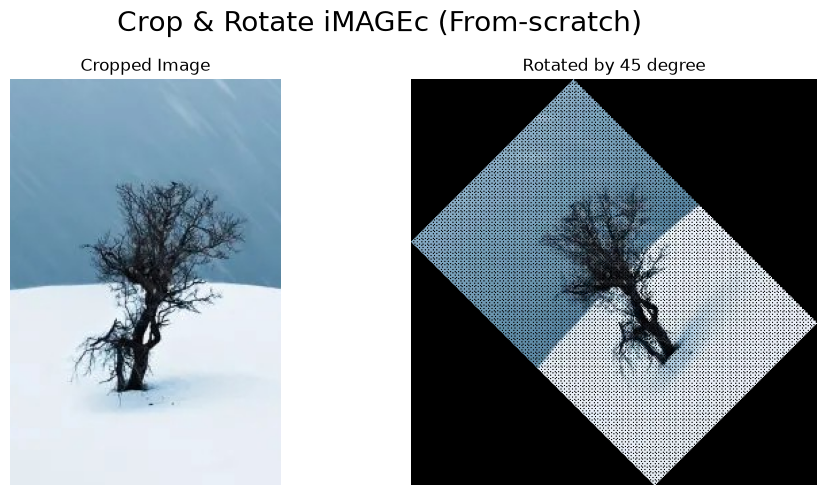

In [21]:
# FROM-SCRATCH IMPLEMENTATION
# Crop the central patch of the image (1/2)

# image dimensions
h, w, c = img.shape

# patch dimensions
patch_h, patch_w = 300, 200

# calculate starting coordinates
start_h = (h - patch_h) // 2
start_w = (w - patch_w) // 2

# extract the patch
img_cropped = img[start_h : start_h + patch_h, start_w : start_w + patch_w]

# Rotate the cropped patch by 45 degrees (2/2)

# generate coordinate pairs from the cropped image
coordinates = np.indices((patch_h, patch_w))
x_coordinates = coordinates[1].ravel()
y_coordinates = coordinates[0].ravel()

"""
    Rotation formula
    x' = x cos t + y sin t
    y' = - x sin t + y cos t
"""
angle = np.deg2rad(45)
x_coordinates_rotated = np.round(x_coordinates * np.cos(angle) + y_coordinates * np.sin(angle)).astype(int)
y_coordinates_rotated = np.round(-x_coordinates * np.sin(angle) + y_coordinates * np.cos(angle)).astype(int)

# shift towards origin
x_coordinates_rotated -= x_coordinates_rotated.min()
y_coordinates_rotated -= y_coordinates_rotated.min()

# calculate dimesnions of the rotated image
h_new = y_coordinates_rotated.max() + 1
w_new = x_coordinates_rotated.max() + 1

# map the pixels to rotated coordinates
img_rotated = np.zeros((h_new, w_new, c), dtype=img_cropped.dtype)
img_rotated[y_coordinates_rotated, x_coordinates_rotated] = img_cropped[y_coordinates, x_coordinates]

# display the cropped image
display_images(
    rows=1, cols=2, 
    channels=[img_cropped, img_rotated], 
    channel_names=['Cropped Image', 'Rotated by 45 degree'],
    title='Crop & Rotate iMAGEc (From-scratch)'
)

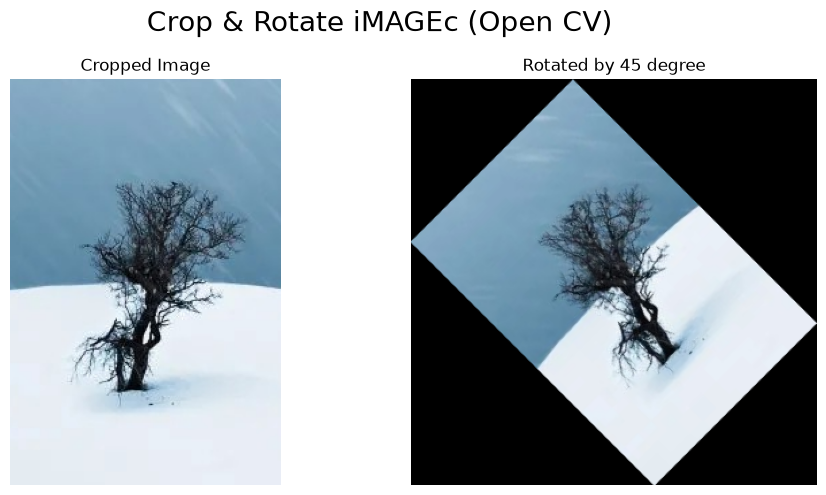

In [22]:
# OPEN CV IMPLEMENTATION
# Crop the central patch of the image (1/2)

# extract the patch
img_cropped_cv = img[start_h : start_h + patch_h, start_w : start_w + patch_w]

# Rotate the cropped patch by 45 degrees (2/2)
centre = (patch_w // 2, patch_h // 2)
rotation_matrix = cv2.getRotationMatrix2D(centre, 45, 1)

# calculate output dimensions
cos = abs(rotation_matrix[0, 0])
sin = abs(rotation_matrix[0, 1])
w_new = int((patch_h * sin) + (patch_w * cos))
h_new = int((patch_h * cos) + (patch_w * sin))

# adjust translation
rotation_matrix[0, 2] += (w_new / 2) - centre[0]
rotation_matrix[1, 2] += (h_new / 2) - centre[1]

# apply rotation
img_rotated_cv = cv2.warpAffine(img_cropped_cv, rotation_matrix, (w_new, h_new))

# display the cropped image
display_images(
    rows=1, cols=2, 
    channels=[img_cropped_cv, img_rotated_cv], 
    channel_names=['Cropped Image', 'Rotated by 45 degree'],
    title='Crop & Rotate iMAGEc (Open CV)'
)

In [23]:
# COMPARSION
errors_crop = np.abs(img_cropped.astype(np.int16) - img_cropped_cv.astype(np.int16))
errors_rotate = np.abs(img_rotated.astype(np.int16) - img_rotated_cv.astype(np.int16))
print("Cropped image comparison")
print("Mean Absolute Error: ", np.mean(errors_crop))
print("Max. Absolute Error: ", np.max(errors_crop))
print("Rotated image comparison")
print("Mean Absolute Error: ", np.mean(errors_rotate))
print("Max. Absolute Error: ", np.max(errors_rotate))

Cropped image comparison
Mean Absolute Error:  0.0
Max. Absolute Error:  0
Rotated image comparison
Mean Absolute Error:  16.08355736744537
Max. Absolute Error:  255


### Task 4.2: Resizing and Interpolation (5 Marks)
- Resize the patch to upsample it by a factor of 2 using Lanczos interpolation. Compare your results with those obtained by using OpenCV
functions.

Lanczos kernel:
$$
L(x) =
\begin{cases}
1, & \text{if } x = 0, \\[6pt]
\dfrac{a\sin(\pi x)\sin(\pi x/a)}
{\pi^2x^2},
& \text{if } -a \leq x < a \text{ and } x \neq 0, \\[8pt]
0, & \text{otherwise.}
\end{cases}
$$

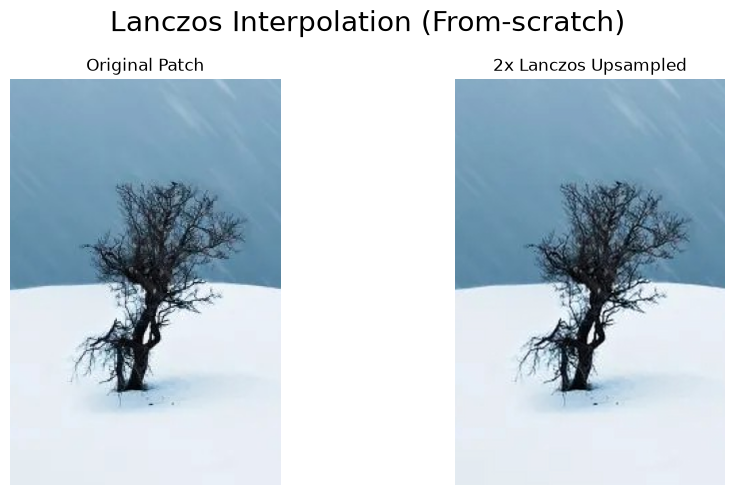

In [24]:
# FROM-SCRATCH IMPLEMENTATION
# Resize the patch to upsample it by a factor of 2 using Lanczos interpolation

def lanczos_kernel(x, a=3):
    x = np.asarray(x, dtype=np.float64)
    kernel = np.zeros_like(x)
    kernel[x == 0] = 1.0
    mask = (x >= -a) & (x < a) & (x != 0)
    kernel[mask] = (a * np.sin(np.pi * x[mask]) * np.sin(np.pi * x[mask] / a)) / (np.pi ** 2 * x[mask] ** 2)
    return kernel
    
# upsample the dimensions
scale = 2       
h, w, c = img_cropped.shape     
h_new, w_new = h * scale, w* scale  

# create output image
img_resized = np.zeros((h_new, w_new, c), dtype=np.float64)

# Lanczos window size
a = 3

# generate coordinates of output pixels
y_new, x_new = np.indices((h_new, w_new))

# map output coordinates to original image coordinates
x = x_new / scale
y = y_new / scale

# interpolate every output pixel
for y_out in range(h_new):
    for x_out in range(w_new):
        # corresponding position in original image
        x_pos = x[y_out, x_out]
        y_pos = y[y_out, x_out]

        # integer pixel around the source position
        x_base = int(np.floor(x_pos))
        y_base = int(np.floor(y_pos))

        # pixels within the Lanczos window
        x_indices = np.arange(x_base - a + 1, x_base + a + 1)
        y_indices = np.arange(y_base - a + 1, y_base + a + 1)

        # keep only valid image coordinates
        valid_x = (x_indices >= 0) & (x_indices < w)
        valid_y = (y_indices >= 0) & (y_indices < h)
        x_indices = x_indices[valid_x]
        y_indices = y_indices[valid_y]

        # calculate 1D Lanczos weights
        x_weights = lanczos_kernel(x_pos - x_indices, a)
        y_weights = lanczos_kernel(y_pos - y_indices, a)

        # interpolate each color channel
        for channel in range(c):
            pixel_value = 0.0
            weight_sum = 0.0
            for j in range(len(y_indices)):
                for i in range(len(x_indices)):
                    weight = (y_weights[j] * x_weights[i])
                    pixel_value += (img_cropped[y_indices[j], x_indices[i], channel] * weight)
                    weight_sum += weight

            # normalize the weights
            if weight_sum != 0:
                pixel_value /= weight_sum

            img_resized[y_out, x_out, channel] = pixel_value

# keep pixel values within valid range
img_resized = np.clip(img_resized, 0, 255).astype(np.uint8)

# display original and resized images
display_images(
    rows=1, cols=2,
    channels=[img_cropped, img_resized],
    channel_names=['Original Patch', '2x Lanczos Upsampled'],
    title='Lanczos Interpolation (From-scratch)'
)

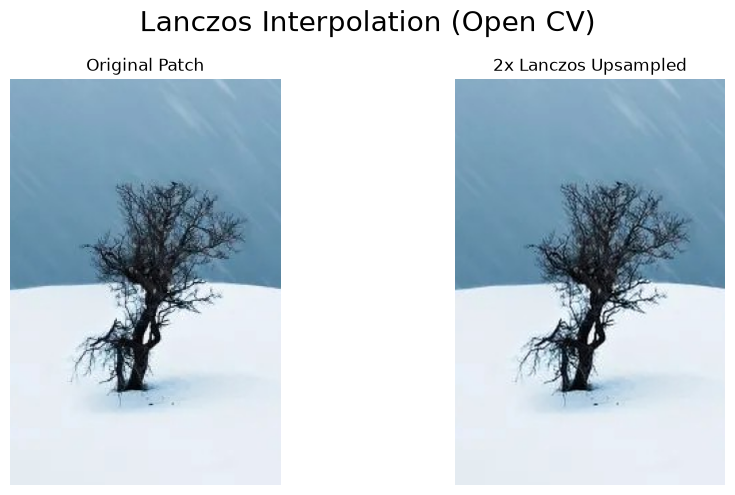

In [25]:
# OPEN CV IMPLEMENTATION
# Resize the patch to upsample it by a factor of 2 using Lanczos interpolation

# upsample the dimensions
scale_cv = 2
h_cv, w_cv, c_cv = img_cropped.shape
h_new_cv, w_new_cv = h_cv * scale_cv, w_cv * scale_cv

# resize using Open CV Lanczos interpolation
img_resized_cv = cv2.resize(img_cropped_cv, (w_new_cv, h_new_cv), interpolation=cv2.INTER_LANCZOS4)

# display original and resized images
display_images(
    rows=1, cols=2,
    channels=[img_cropped_cv, img_resized_cv],
    channel_names=['Original Patch', '2x Lanczos Upsampled'],
    title='Lanczos Interpolation (Open CV)'
)

In [26]:
# COMPARISON
errors = np.abs(img_resized.astype(np.int16) - img_resized_cv.astype(np.int16))
print("Lanczos interpolated image comparison")
print("Mean Absolute Error:", np.mean(errors))
print("Max. Absolute Error:", np.max(errors))

Lanczos interpolated image comparison
Mean Absolute Error: 2.401325
Max. Absolute Error: 90


---
End of the Assignment